In [31]:
# import all the required libraries
import glob
import pandas as pd
import numpy as np

import re
import string
import nltk

from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
stopwords_eng = stopwords.words("english")
from nltk.corpus import wordnet

!pip install wordcloud
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import LabelEncoder

!pip install autocorrect
from autocorrect import Speller
spell = Speller()

# import tqdm for progress bars
from tqdm import tqdm

import plotly.express as px
import matplotlib.pyplot as plt

!pip install spacy
import spacy
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 54.7 MB/s eta 0:00:0000:010:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


### setting max_colwidth to None to see all the strings of longer length on a single line.

In [32]:
pd.set_option('display.max_colwidth', None)

## Loading all the csv file scraped from linkedin

In [33]:
datasets = glob.glob('../dataset/*.csv')
dataframes = [pd.read_csv(file) for file in datasets]
df = pd.concat(dataframes, axis = 0, ignore_index=True)

Looking at the top 5 records of concatenated dataset

In [34]:
df.head()

,job id,job_title,company_name,company_location,posted_time,description
0,3856120323,Vice President of Customer Support,Motion Recruitment,"Atlanta, GA",1 hour ago,"Vice President of Customer SupportAs the Vice President of Customer Support, you'll lead a dynamic team dedicated to enhancing the customer experience, driving satisfaction, and fostering loyalty. Your strategic vision and operational prowess will be instrumental in shaping the support landscape to align with the company's overarching goals and objectives.Key Responsibilities:Leadership and Strategy:Develop and execute a comprehensive customer support strategy that aligns with the company mission.Define clear performance objectives and KPIs to drive team excellence.Provide strategic leadership, aligning team efforts with organizational values.Foster a customer-centric culture, emphasizing excellence in customer experiences.Team Management:Recruit, train, and manage a team of customer support professionals to ensure alignment with company objectives.Offer ongoing coaching, feedback, and performance evaluations to nurture team development.Establish robust communication frameworks to foster a supportive team environment.Implement succession planning and talent development initiatives for sustained team effectiveness.Customer Experience Enhancement:Identify areas for improvement through thorough analysis of customer feedback and industry benchmarks.Collaborate cross-functionally to address customer issues and drive enhancements.Implement cutting-edge support technologies to optimize efficiency and personalize service.Stay abreast of industry trends to adapt strategies and maintain competitiveness.Performance Monitoring and Analysis:Monitor and analyze key support metrics and KPIs to drive performance improvements.Utilize data-driven insights to identify opportunities and implement strategies for enhancement.Prepare comprehensive reports and presentations for senior leadership, outlining successes, challenges, and proposed actions.Relationship Management:Cultivate and maintain relationships with key customers, partners, and stakeholders to understand needs and resolve issues.Collaborate closely with sales and account management teams to ensure seamless customer experiences.Act as a customer advocate within the organization, championing initiatives to enhance satisfaction.Crisis and Escalation Management:Develop and implement crisis management procedures to effectively handle escalations and challenging situations.Ensure timely and satisfactory resolution of escalated concerns, maintaining professionalism and clarity in communication.Address systemic issues proactively to prevent future escalations through corrective actions.Qualifications:Demonstrated senior leadership experience in customer support or related fields.In-depth knowledge of customer support strategies, best practices, and emerging technologies.Strong leadership qualities, with the ability to inspire and guide diverse teams.Excellent communication and interpersonal skills for effective stakeholder engagement.Analytical mindset, capable of leveraging data to drive continuous improvement.Strategic thinking and problem-solving abilities focused on achieving business objectives.Deep commitment to customer service excellence and empathy.Proven crisis management and escalation handling experience.Bachelor's degree in business administration, marketing, or related fields.Additional Information:Quarterly travel may be required to support offices and attend meetings.This is an excellent opportunity to become part of an awesome organization. Apply today to learn more!"
1,3852723097,Sr. Customer Success Manager,Social Benefit,"Los Angeles, CA",28 minutes ago,"Job OverviewSocial Benefit is seeking a Senior Customer Success Manager to join our team. This individual will report to the Head of Customer Experience and play a pivotal role in ensuring that Navigator users are able to take full advantage of the tool’s capabi

In [35]:
df.columns

Index(['job id', 'job_title', 'company_name', 'company_location',
       'posted_time', 'description'],
      dtype='object')

In [36]:
df.shape

(19906, 6)

In [37]:
df.drop_duplicates(subset=['job id', 'description'], inplace=True)

In [38]:
df.shape

(8077, 6)

In [39]:
df.dtypes

job id              object
job_title           object
company_name        object
company_location    object
posted_time         object
description         object
dtype: object

In [40]:
pip install dateparser

Note: you may need to restart the kernel to use updated packages.


# Importing all the required libraries

In [41]:
import dateparser
dates= df['posted_time'].tolist()
posted_date=[]
for i in dates:
    date= dateparser.parse(str(i))
    date = date.strftime("%Y-%m-%d")
    posted_date.append(date)
                           
                           

df['posted_date']= posted_date

In [42]:
df.head()

,job id,job_title,company_name,company_location,posted_time,description,posted_date
0,3856120323,Vice President of Customer Support,Motion Recruitment,"Atlanta, GA",1 hour ago,"Vice President of Customer SupportAs the Vice President of Customer Support, you'll lead a dynamic team dedicated to enhancing the customer experience, driving satisfaction, and fostering loyalty. Your strategic vision and operational prowess will be instrumental in shaping the support landscape to align with the company's overarching goals and objectives.Key Responsibilities:Leadership and Strategy:Develop and execute a comprehensive customer support strategy that aligns with the company mission.Define clear performance objectives and KPIs to drive team excellence.Provide strategic leadership, aligning team efforts with organizational values.Foster a customer-centric culture, emphasizing excellence in customer experiences.Team Management:Recruit, train, and manage a team of customer support professionals to ensure alignment with company objectives.Offer ongoing coaching, feedback, and performance evaluations to nurture team development.Establish robust communication frameworks to foster a supportive team environment.Implement succession planning and talent development initiatives for sustained team effectiveness.Customer Experience Enhancement:Identify areas for improvement through thorough analysis of customer feedback and industry benchmarks.Collaborate cross-functionally to address customer issues and drive enhancements.Implement cutting-edge support technologies to optimize efficiency and personalize service.Stay abreast of industry trends to adapt strategies and maintain competitiveness.Performance Monitoring and Analysis:Monitor and analyze key support metrics and KPIs to drive performance improvements.Utilize data-driven insights to identify opportunities and implement strategies for enhancement.Prepare comprehensive reports and presentations for senior leadership, outlining successes, challenges, and proposed actions.Relationship Management:Cultivate and maintain relationships with key customers, partners, and stakeholders to understand needs and resolve issues.Collaborate closely with sales and account management teams to ensure seamless customer experiences.Act as a customer advocate within the organization, championing initiatives to enhance satisfaction.Crisis and Escalation Management:Develop and implement crisis management procedures to effectively handle escalations and challenging situations.Ensure timely and satisfactory resolution of escalated concerns, maintaining professionalism and clarity in communication.Address systemic issues proactively to prevent future escalations through corrective actions.Qualifications:Demonstrated senior leadership experience in customer support or related fields.In-depth knowledge of customer support strategies, best practices, and emerging technologies.Strong leadership qualities, with the ability to inspire and guide diverse teams.Excellent communication and interpersonal skills for effective stakeholder engagement.Analytical mindset, capable of leveraging data to drive continuous improvement.Strategic thinking and problem-solving abilities focused on achieving business objectives.Deep commitment to customer service excellence and empathy.Proven crisis management and escalation handling experience.Bachelor's degree in business administration, marketing, or related fields.Additional Information:Quarterly travel may be required to support offices and attend meetings.This is an excellent opportunity to become part of an awesome organization. Apply today to learn more!",2024-03-15
1,3852723097,Sr. Customer Success Manager,Social Benefit,"Los Angeles, CA",28 minutes ago,"Job OverviewSocial Benefit is seeking a Senior Customer Success Manager to join our team. This individual will report to the Head of Customer Experience and play a pivotal role in ensuring that Navigator users are able to take full advanta

In [43]:
df['company_location'].nunique()

1201

In [44]:
df['job_title'].nunique()

2688

In [45]:
df['company_name'].nunique()


2226

In [46]:
df['posted_date'].nunique()

24

In [47]:
df.isna().sum()

job id              0
job_title           3
company_name        3
company_location    3
posted_time         3
description         3
posted_date         0
dtype: int64

In [48]:
df.dropna(inplace=True)

In [49]:
df.isna().sum()

job id              0
job_title           0
company_name        0
company_location    0
posted_time         0
description         0
posted_date         0
dtype: int64

In [50]:
df.info()
# from this we can see that all of our data is categorical , we have dealt with the missing values and after removing 
#duplicate columns we have total of 8032 rows

<class 'pandas.core.frame.DataFrame'>
Index: 8074 entries, 0 to 19902
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   job id            8074 non-null   object
 1   job_title         8074 non-null   object
 2   company_name      8074 non-null   object
 3   company_location  8074 non-null   object
 4   posted_time       8074 non-null   object
 5   description       8074 non-null   object
 6   posted_date       8074 non-null   object
dtypes: object(7)
memory usage: 504.6+ KB


In [51]:
df.groupby(['company_name','job_title']).count()[:5]

job id  \
company_name                       job_title                               
1-888-MDSEARCH, Inc.               Cardiac Anesthesia                  2   
1199SEIU Benefit and Pension Funds Quality Control Reviewer III        1   
24 Seven Talent                    Copywriter                          2   
                                   Copywriter (full-time Remote)       2   
                                   Marketing Associate (B2B)           1   

                                                                  company_location  \
company_name                       job_title                                         
1-888-MDSEARCH, Inc.               Cardiac Anesthesia                            2   
1199SEIU Benefit and Pension Funds Quality Control Reviewer III                  1   
24 Seven Talent                    Copywriter                                    2   
                                   Copywriter (full-time Remote)                 2   
                                   Marketing Associate (B2B)                     1   

                                                                  posted_time  \
company_name                       job_title                                    
1-888-MDSEARCH, Inc.               Cardiac Anesthesia                       2   
1199SEIU Benefit and Pension Funds Quality Control Reviewer III             1   
24 Seven Talent                    Copywriter                               2   
                                   Copywriter (full-time Remote)            2   
                                   Marketing Associate (B2B)                1   

                                                                  description  \
company_name                       job_title                                    
1-888-MDSEARCH, Inc.               Cardiac Anesthesia                       2   
1199SEIU Benefit and Pension Funds Quality Control Reviewer III             1   
24 Seven Talent                    Copywriter                               2   
                                   Copywriter (full-time Remote)            2   
                                   Marketing Associate (B2B)                1   

                                                                  posted_date  
company_name                       job_title                                   
1-888-MDSEARCH, Inc.               Cardiac Anesthesia                       2  
1199SEIU Benefit and Pension Funds Quality Control Reviewer III             1  
24 Seven Talent                    Copywriter                               2  
                                   Copywriter (full-time Remote)            2  
                                   Marketing Associate (B2B)                1

In [52]:
df.groupby('job_title')['job id'].count()[:5]

job_title
$300/hr - Locum Anesthesiologist               2
(Concentrated/Long-only) Investment Analyst    2
(US) Project Manager, Acute & Payer            2
*Lifeguard (Indoor) * $19.00/hr                2
*Pharmacist                                    4
Name: job id, dtype: int64

In [53]:
df.job_title.mode()

0    Orthodontist
Name: job_title, dtype: object

In [54]:
df[df['job_title']=='Data Scientist'].head()

job id       job_title           company_name  \
685  3813401609  Data Scientist                   CPKC   
708  3850504548  Data Scientist  Benchmark Recruitment   
735  3802376320  Data Scientist                  Kabam   
754  3844087769  Data Scientist           mlHealth 360   
762  3848813368  Data Scientist             EHN Canada   

                        company_location  posted_time  \
685             Calgary, Alberta, Canada   3 days ago   
708  Vancouver, British Columbia, Canada    1 day ago   
735  Vancouver, British Columbia, Canada  2 weeks ago   
754     Surrey, British Columbia, Canada   4 days ago   
762             Toronto, Ontario, Canada   5 days ago   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

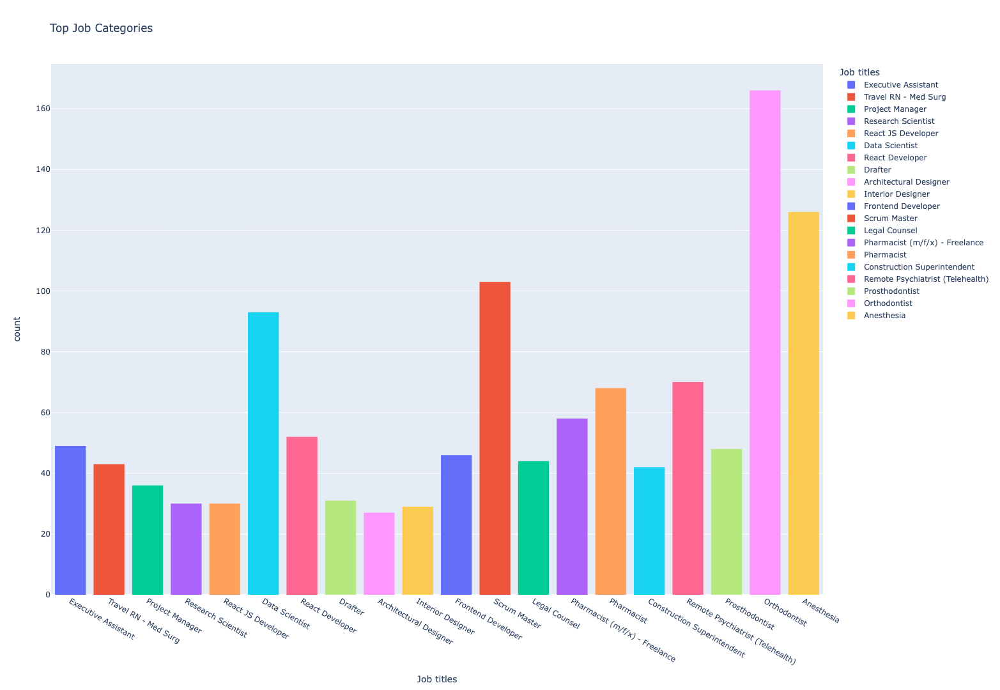

In [55]:
#using a countplot to plotmost frequent job title
# plt.figure(figsize=(10,6))
# sns.countplot(data=df,x='job_title',order=df['job_title'].value_counts()[:10].index)
# plt.xticks(rotation=70)
# plt.title('Count of accident  occured in each district')
# plt.show
# df[df['job_title'].value_counts()[:10].index]

top_jobs = df['job_title'].value_counts()[:20].index
top_jobs_df = df[df['job_title'].isin(top_jobs)]

px.histogram(top_jobs_df, x='job_title', color='job_title', title='Top Job Categories', height=1080,labels={
    'job_title': 'Job titles',
    'count': 'Number of jobs'
})

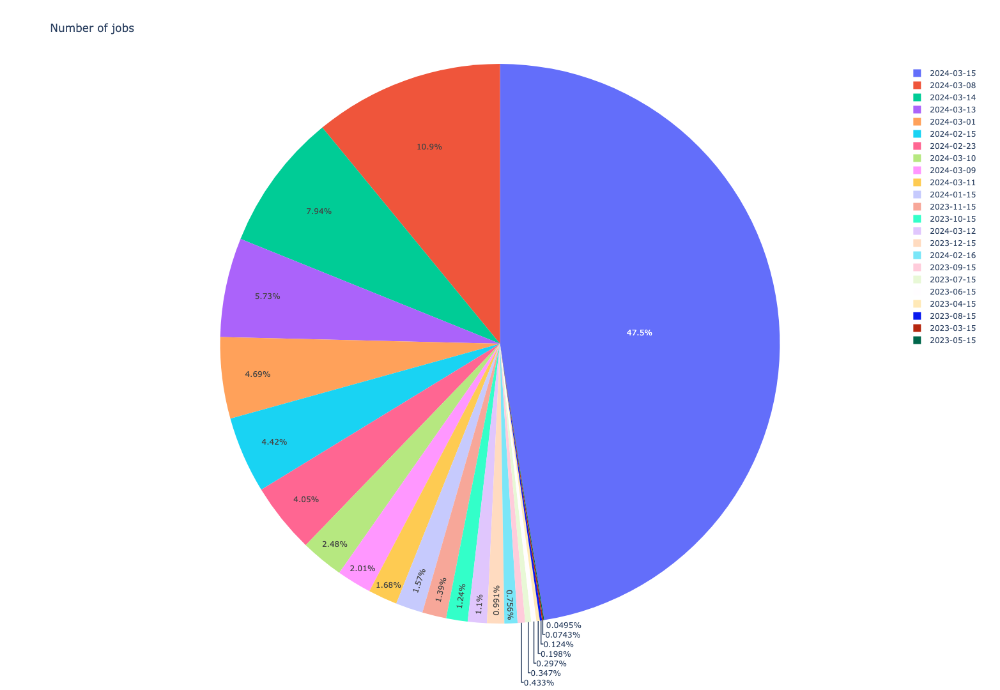

In [56]:
#pie-chart to see what time of the year has highest job posting 
# df['posted_date'].value_counts().plot(kind='pie',autopct='%.2f')
top_post_dates = df['posted_date'].value_counts()

px.pie(top_post_dates.reset_index(), values='count', names='posted_date', title='Number of jobs', height=1080, labels={
    'posted_date': 'Job post date'
})

,posted_date,proportion
0,2024-03-15,47.473371
1,2024-03-08,10.948724
2,2024-03-14,7.939064
3,2024-03-13,5.734456
4,2024-03-01,4.694080
5,2024-02-15,4.421600
6,2024-02-23,4.050037
7,2024-03-10,2.477087
8,2024-03-09,2.006440
9,2024-03-11,1.684419


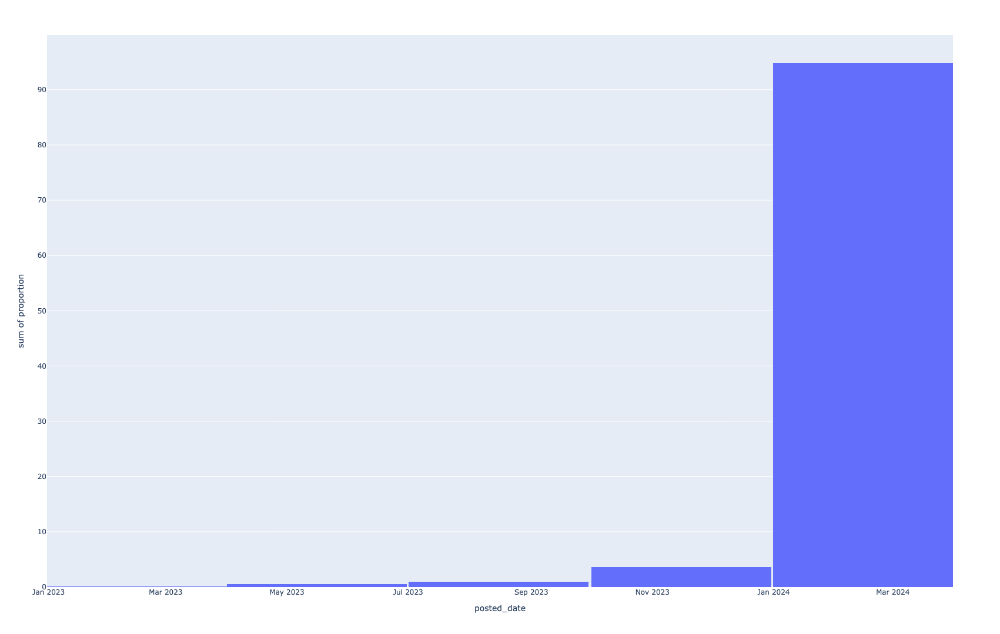

In [57]:
# plt.hist(df['posted_date'].value_counts())
# plt.xlabel('Date')
# plt.ylabel('Frequency')
# plt.title('Histogram showing the distribution of job posting')
# plt.show()
top_post_dates_pct = df['posted_date'].value_counts(normalize=True) * 100
display(top_post_dates_pct.reset_index())
px.histogram(top_post_dates_pct.reset_index(), x='posted_date', y='proportion', height=1080)

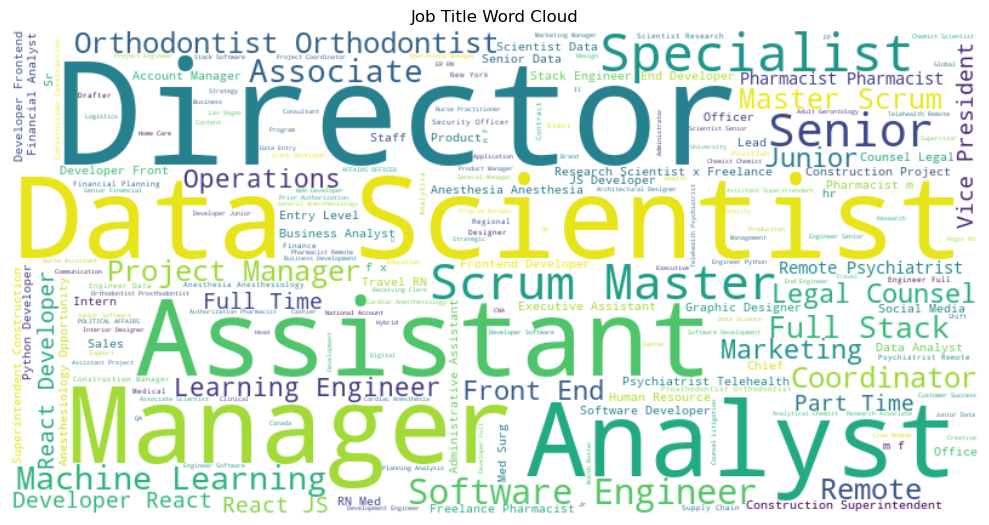

In [58]:
#Visualisation of Job Title WordCloud
# Visualization 1: Creating a word cloud from job titles
from wordcloud import WordCloud
job_titles_text = ' '.join(df['job_title'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(job_titles_text)

# Display the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Job Title Word Cloud')
plt.axis('off')
plt.tight_layout()
plt.show()

In [59]:
df['company_location'][:30]

0                         Atlanta, GA
1                     Los Angeles, CA
2                     Kailua-Kona, HI
3                        New York, NY
4                       United States
5     New York City Metropolitan Area
6     New York City Metropolitan Area
7                       United States
8                     Springville, UT
9                     North Miami, FL
10                    Bloomington, IL
11                       New York, NY
12                    New Orleans, LA
13                         Cadott, WI
14                      United States
15                          Arden, NC
16                         Dallas, TX
17                      Tobyhanna, PA
18                     Hackensack, NJ
19                    Los Angeles, CA
20                    Wake Forest, NC
21                    Mount Kisco, NY
22                  Oklahoma City, OK
23                      Rochester, NY
24                        Chicago, IL
25                     El Segundo, CA
26          

In [27]:
pip install ydata_profiling


Note: you may need to restart the kernel to use updated packages.


In [ ]:
profile = ProfileReport(df, title="Profiling Report")

In [29]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [30]:
profile.to_file('Linkedln jobs profile.html')

/Users/shreyabaral/anaconda3/lib/python3.11/site-packages/ydata_profiling/profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [60]:
df.dtypes

job id              object
job_title           object
company_name        object
company_location    object
posted_time         object
description         object
posted_date         object
dtype: object

## Load SpaCy's English model and use NER to extract salary

In [61]:
# Load SpaCy's English model
nlp = spacy.load("en_core_web_sm")

# Function to extract salary information using NER
def extract_salary(text):
    if not isinstance(text, str): 
        return []
    doc = nlp(text)
    salary = []
    for ent in doc.ents:
        if ent.label_ == 'MONEY':
            if isinstance(ent.text, str):
                salary.append(ent.text)
    return salary

df['salary'] = df['description'].apply(extract_salary)

In [62]:
df.shape

(8074, 8)

In [63]:
def fillna(colval): 
    if(len(colval) > 0): 
        return colval
    else: 
        return np.nan

In [64]:
# function to fill np.nan where there are empty arrays
def fillna(colval): 
    if(len(colval) > 0): 
        return colval
    else: 
        return np.nan

In [65]:
df['salary'] = df['salary'].apply(fillna)

In [66]:
df.salary.isnull().sum()

5359

In [67]:
# feature engineering, function to get sentence count
def get_sent_count(desc): 
    if not isinstance(desc, str): 
        return 0
    return len(sent_tokenize(desc))

In [68]:
# function to get word count
def get_word_count(desc): 
    if not isinstance(desc, str): 
        return 0
    return len(word_tokenize(desc))

# Concat job title and job description

In [69]:
df['job_description'] = df['job_title'] + df['description']

In [70]:
df['sent_count'] = df.job_description.apply(get_sent_count)

In [71]:
df['word_count'] = df.job_description.apply(get_word_count)

In [72]:
# statistical job_description of sent_count column
df['sent_count'].describe()

count    8074.000000
mean       13.683924
std        14.067485
min         1.000000
25%         5.000000
50%         9.000000
75%        18.000000
max       141.000000
Name: sent_count, dtype: float64

In [73]:
# statistical job_description of word_count column
df['word_count'].describe()

count    8074.000000
mean      573.938692
std       447.678308
min        11.000000
25%       274.000000
50%       463.000000
75%       720.000000
max      3539.000000
Name: word_count, dtype: float64

## Outlier Detection

### Box plots

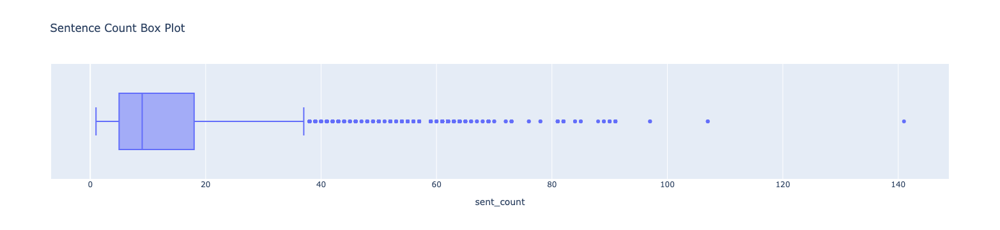

In [74]:
fig = px.box(df, x="sent_count", title="Sentence Count Box Plot")
fig.show()

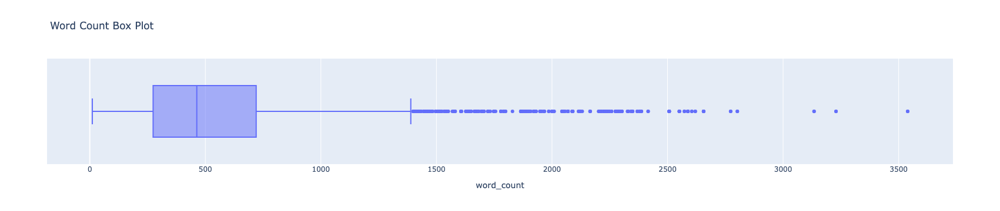

In [75]:
fig = px.box(df, x="word_count", title="Word Count Box Plot")
fig.show()

### Histogram plots

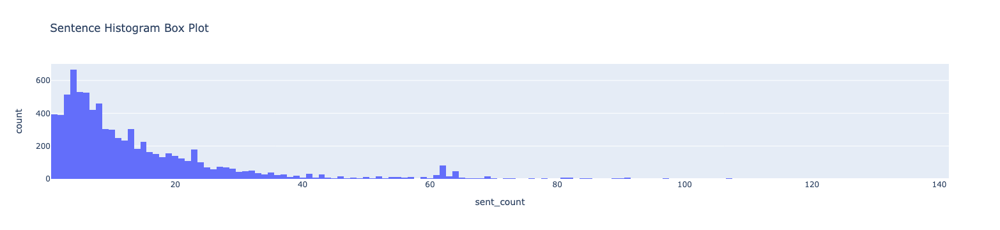

In [76]:
fig = px.histogram(df, x='sent_count',title="Sentence Histogram Box Plot")
fig.show()

In [77]:
df['sent_count'].skew().round(2)

2.38

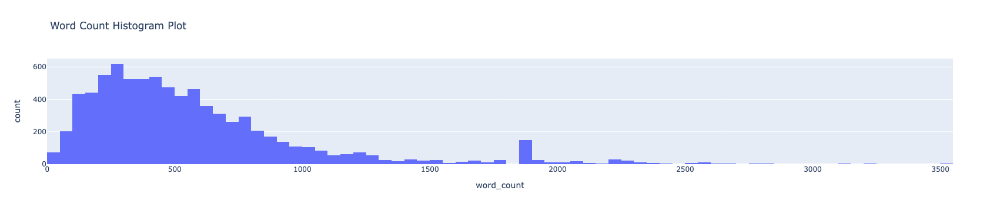

In [78]:
fig = px.histogram(df, x='word_count', title="Word Count Histogram Plot")
fig.show()

In [79]:
df['word_count'].skew().round(2)

1.96

## Outliers removal

### outliers removal using trimming

In [80]:
def calculate_whiskers(colname): 
    q1 = df[colname].quantile(.25)
    q3 = df[colname].quantile(.75)
    iqr = q3 - q1
    w_multiplier = 1.5 * iqr
    lower_whisker = q1 - w_multiplier
    upper_whisker = q3 + w_multiplier
    return upper_whisker, lower_whisker

In [81]:
# lets do 2 techniques, Capping, Log transformation
def trimming_outlier(tb_df, colname):
    print('Number of records in DataFrame', tb_df.shape)
    uw, lw = calculate_whiskers(colname)
    index = tb_df[(tb_df[colname] > lw) & (tb_df[colname] < uw)]
    print('Number of records in DataFrame after removing outlier', index.shape)
    
    return index
    

In [82]:
t_df = trimming_outlier(df, 'sent_count')

Number of records in DataFrame (8074, 11)
Number of records in DataFrame after removing outlier (7593, 11)


In [83]:
t_df = trimming_outlier(t_df, 'word_count')

Number of records in DataFrame (7593, 11)
Number of records in DataFrame after removing outlier (7465, 11)


In [84]:
t_df['sent_count'].skew().round(2)

1.05

In [85]:
t_df['word_count'].skew().round(2)

0.72

## Trimming outliers

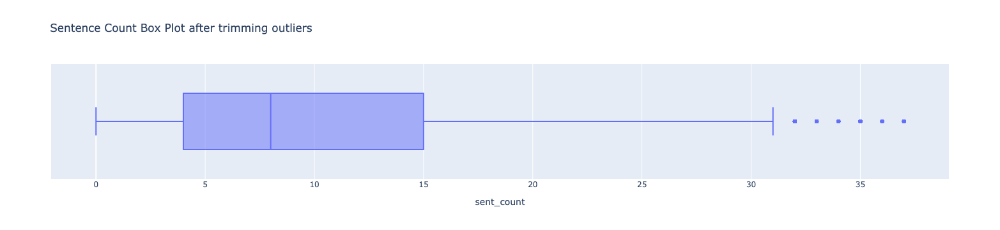

In [28]:
fig = px.box(t_df, x="sent_count", title="Sentence Count Box Plot after trimming outliers")
fig.show()

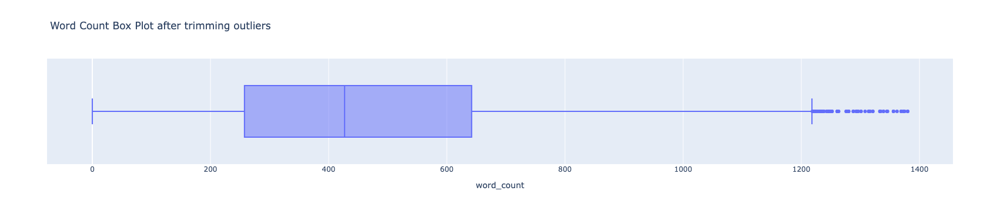

In [29]:
fig = px.box(t_df, x="word_count", title="Word Count Box Plot after trimming outliers")
fig.show()

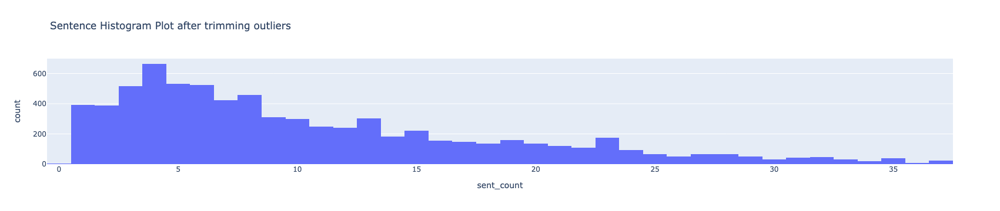

In [30]:
fig = px.histogram(t_df, x='sent_count',title="Sentence Histogram Plot after trimming outliers")
fig.show()

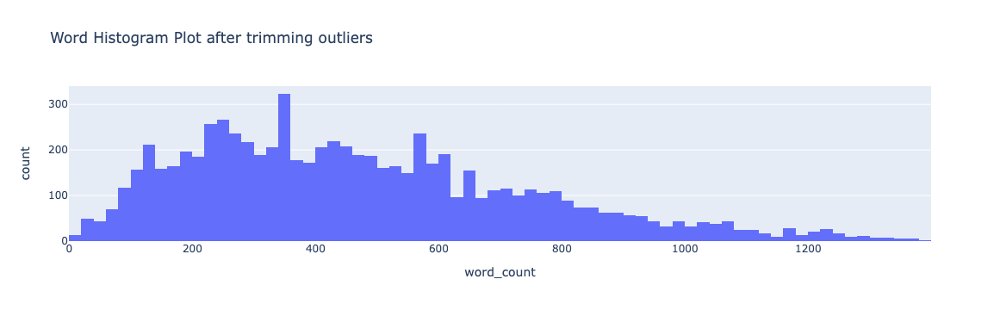

In [31]:
fig = px.histogram(t_df, x='word_count',title="Word Histogram Plot after trimming outliers")
fig.show()

### Log transformation

In [32]:
def log_transformation(colname): 
    df[f'{colname}_logscale'] = df[colname].map(lambda x: np.log(x) if x > 0 else 0)

In [33]:
l_df = log_transformation('sent_count')

In [34]:
l_df = log_transformation('word_count')

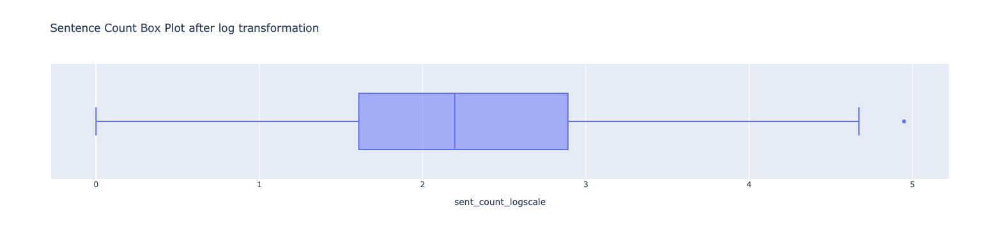

In [35]:
fig = px.box(df, x="sent_count_logscale", title="Sentence Count Box Plot after log transformation")
fig.show()

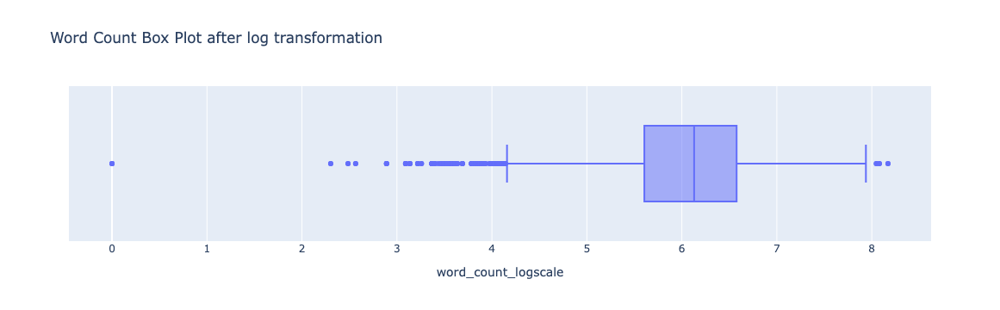

In [36]:
fig = px.box(df, x="word_count_logscale", title="Word Count Box Plot after log transformation")
fig.show()

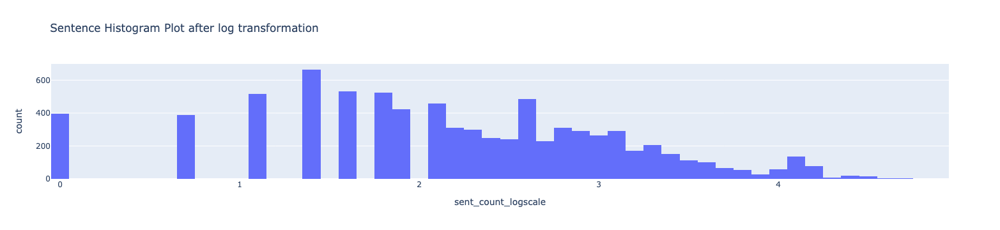

In [37]:
fig = px.histogram(df, x='sent_count_logscale',title="Sentence Histogram Plot after log transformation")
fig.show()

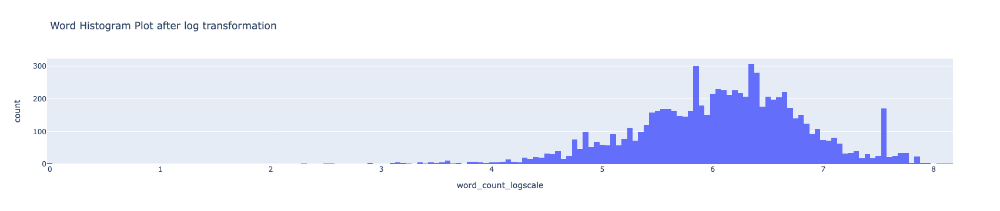

In [38]:
fig = px.histogram(df, x='word_count_logscale',title="Word Histogram Plot after log transformation")
fig.show()

In [39]:
df['sent_count_logscale'].skew().round(2)

-0.18

In [40]:
df['word_count_logscale'].skew().round(2)

-0.61

In [86]:
df = t_df

### removing null values

In [87]:
df.job_description.isnull().sum()

0

In [88]:
# number of null values in dataframe
df.isnull().sum() 

job id                 0
job_title              0
company_name           0
company_location       0
posted_time            0
description            0
posted_date            0
salary              5058
job_description        0
sent_count             0
word_count             0
dtype: int64

In [89]:
df.shape

(7465, 11)

In [90]:
df.iloc[0].job_description

"Vice President of Customer SupportVice President of Customer SupportAs the Vice President of Customer Support, you'll lead a dynamic team dedicated to enhancing the customer experience, driving satisfaction, and fostering loyalty. Your strategic vision and operational prowess will be instrumental in shaping the support landscape to align with the company's overarching goals and objectives.Key Responsibilities:Leadership and Strategy:Develop and execute a comprehensive customer support strategy that aligns with the company mission.Define clear performance objectives and KPIs to drive team excellence.Provide strategic leadership, aligning team efforts with organizational values.Foster a customer-centric culture, emphasizing excellence in customer experiences.Team Management:Recruit, train, and manage a team of customer support professionals to ensure alignment with company objectives.Offer ongoing coaching, feedback, and performance evaluations to nurture team development.Establish robu

In [91]:
df.sample(n=3, random_state=42)[['job_description']]

,job_description
4736,"Financial Analysis & Controls 5Job Title: Financial Analysis & Controls 5 Job Type: Contract Site Type: Onsite (Redmond, WA) Duration: 9 Months 14 Days Job OverviewDo you have a passion for financial reporting? Are you looking for an opportunity to directly impact accounting and reporting at a Fortune 100 company? We have an exciting opportunity for a highly motivated, collaborative professional to join our External Reporting team. This position is part of the Corporate Accounting team that drives accounting and financial reporting excellence in the company. The Corporate Accounting team prepares, analyzes, and reviews our consolidated financial results and ensures compliance with US GAAP (GAAP) and Securities and Exchange Commission (SEC) reporting requirements. This External Reporting position plays a critical role in our financial reporting to shareholders and offers a unique enterprise-wide view of the company from the financial core. The position collaborates closely with a variety of stakeholders across the company, with direct visibility of senior leaders, and provides a great opportunity to grow and deliver impact. This position will report to the Senior Finance Director responsible for External Reporting in the company.Job ResponsibilitiesPlay a key role in the end-to-end process for periodic SEC filings, including 10-Qs and 10-Ks (and associated XBRL reporting efforts), to ensure that financial statements adhere to GAAP and SEC regulations Provide support to business partners, including Legal (CELA), Human Resources, and Investor Relations, to ensure the accuracy of other filings such as the Proxy Statement, benefit plan 11-Ks, earnings release 8-Ks, and foreign filings Partner with business groups, the Central Finance Team, and Investor Relations to understand key drivers of financial results and ensure accurate and consistent messaging across management reporting, earnings materials, and SEC filings Maintain knowledge of GAAP and SEC regulations, monitor changes to accounting and reporting guidance, assess the impact to the company, and make necessary changes to policies, controls, and disclosures as appropriate Understand internal accounting policies and maintain SOX compliance for certain controls over financial reporting Contribute toward improving effectiveness and efficiency in the corporate monthly/quarterly close and reporting process Other projects as designated Job RequirementsBS/BA degree in Finance or Accounting, or equivalent experience Minimum of 10 years of related work experience, preferably some public accounting; Additional years of experience preferred Accounting and/or financial reporting and analysis experience Knowledge of GAAP accounting and SEC reporting, including experience with technical research and implementation Experience with computer applications such as Microsoft Word, Excel, PowerPoint, and related financial software Experience with SEC-registered companies required Professional accounting certification, such as Certified Public Accountant (CPA) or equivalent Strong knowledge of GAAP accounting and SEC reporting, including experience with technical research and implementation Working knowledge of XBRL is a plus Strong project management skills including experience collaborating successfully across multiple teams and levels Excellent written and verbal communication skills with an ability to effectively communicate complex information, build trust, and influence key stakeholders Highly organized, able to manage multiple/competing activities under tight deadlines, prioritize for impact, and deliver results Must be flexible, adaptable, and detail-oriented"
12893,"AnesthesiologistOverviewDenton Division - If you’re looking to make top compensation in the Northern Dallas suburbs, US Anesthesia Partners collaborative and collegial physician-owned and led opportunities are worth exploring. Our long-standing USAP North Texas practice is growing.The team you would be 

## Data Wrangling

First thing we noticed while looking at the job job_description scraped from Linkedin is that there are sentences which are not ended with a period "." and two sentences are joined.

For example: 
* "Position **OverviewJob Title**: **AnesthesiologistCertification**: MD"
* "**DescriptionSpecialization:AnesthesiologyAnesthesiology** CardiacJob Summary:"
* "401(k) match that increases with years of service and 100% Company paid occurrence-based malpractice **insuranceEmployee** stock purchase discount **planAbout** HCA Florida Bayonet Point Hospital:290-bed acute care facility is the only"

This could be a job_description provided on a new line were concatenated on a same line while scraping data. We'll fix this using a regex.


In [92]:
# function to add space between the words separated by newline but were joined while scraping 
def fix_new_line(desc): 
    return re.sub(r'\B(\w+)([A-Z]+[a-z]+)',r'\1 \2', desc)

In [93]:
# testing fix_new_line func
fix_new_line("Anesthesia physician employment in Tennessee : Inpatient Facility: Looking for an experienced Anesthesiologist in the Memphis, Tennessee area. Below you will find the Position Overview with all the detail regarding the position.Position OverviewJob Title: AnesthesiologistCertification: MD, DOSpecialty: AnesthesiologySetting: InpatientCredential Requirements: TN Medical License , DEA License, Board CertificationScheduling & LogisticsPT/FT: Full TimeOrder Type: Locum TenensShift: M-F + Weekend + Call; 8's 10's 12's and 24's available;Days Per Week: 5Hours per Week: 40Housing Notes: Flight, Hotel, Car Rental, MileageTransportation Notes: YesKPG Provider Services is a West Coast Focused Company with offices in Los Angeles and Las Vegas. We are focused on offering the best, most rewarding opportunities while providing excellent compensation and support. Outstanding service is at the core of our culture. Our Medical Professionals will experience a service relationship characterized by respect, a sense of urgency, and attention to detail.Our team offers benefits like geographic expertise, understanding commuting times, and top market compensation rates.In short, we focus intently on the things that matter to you with a commitment to achieve exceptional outcomes. Call us and experience the difference!For a complete listing of our current openings visit www.kpgproviders.com! Board Certified or Board Eligible Medical Doctor with or w/o US residency with current US work visa.")

"Anesthesia physician employment in Tennessee : Inpatient Facility: Looking for an experienced Anesthesiologist in the Memphis, Tennessee area. Below you will find the Position Overview with all the detail regarding the position.Position Overview Job Title: Anesthesiologist Certification: MD, DO Specialty: Anesthesiology Setting: Inpatient Credential Requirements: TN Medical License , DEA License, Board Certification Scheduling & LogisticsPT/FT: Full Time Order Type: Locum Tenens Shift: M-F + Weekend + Call; 8's 10's 12's and 24's available;Days Per Week: 5Hours per Week: 40 Housing Notes: Flight, Hotel, Car Rental, Mileage Transportation Notes: YesKPG Provider Services is a West Coast Focused Company with offices in Los Angeles and Las Vegas. We are focused on offering the best, most rewarding opportunities while providing excellent compensation and support. Outstanding service is at the core of our culture. Our Medical Professionals will experience a service relationship characterize

In [94]:
def remove_urls(desc): 
    return re.sub(r'(https:\/\/www\.|http:\/\/www\.|https:\/\/|http:\/\/)?[a-zA-Z]{2,}(\.[a-zA-Z]{2,})(\.[a-zA-Z]{2,})?\/[a-zA-Z0-9]{2,}|((https:\/\/www\.|http:\/\/www\.|https:\/\/|http:\/\/)?[a-zA-Z]{2,}(\.[a-zA-Z]{2,})(\.[a-zA-Z]{2,})?)|(https:\/\/www\.|http:\/\/www\.|https:\/\/|http:\/\/)?[a-zA-Z0-9]{2,}\.[a-zA-Z0-9]{2,}\.[a-zA-Z0-9]{2,}(\.[a-zA-Z0-9]{2,})?', ' ', desc)

In [95]:
remove_urls("Anesthesia physician employment in Tennessee : Inpatient Facility: Looking for an experienced Anesthesiologist in the Memphis, Tennessee area. Below you will find the Position Overview with all the detail regarding the position.Position Overview Job Title: Anesthesiologist Certification: MD, DO Specialty: Anesthesiology Setting: Inpatient Credential Requirements: TN Medical License , DEA License, Board Certification Scheduling & LogisticsPT/FT: Full Time Order Type: Locum Tenens Shift: M-F + Weekend + Call; 8's 10's 12's and 24's available;Days Per Week: 5Hours per Week: 40 Housing Notes: Flight, Hotel, Car Rental, Mileage Transportation Notes: YesKPG Provider Services is a West Coast Focused Company with offices in Los Angeles and Las Vegas. We are focused on offering the best, most rewarding opportunities while providing excellent compensation and support. Outstanding service is at the core of our culture. Our Medical Professionals will experience a service relationship characterized by respect, a sense of urgency, and attention to detail.Our team offers benefits like geographic expertise, understanding commuting times, and top market compensation rates.In short, we focus intently on the things that matter to you with a commitment to achieve exceptional outcomes. Call us and experience the difference!For a complete listing of our current openings visit www.kpgproviders.com! Board Certified or Board Eligible Medical Doctor with or w/o US residency with current US work visa.")

"Anesthesia physician employment in Tennessee : Inpatient Facility: Looking for an experienced Anesthesiologist in the Memphis, Tennessee area. Below you will find the Position Overview with all the detail regarding the   Overview Job Title: Anesthesiologist Certification: MD, DO Specialty: Anesthesiology Setting: Inpatient Credential Requirements: TN Medical License , DEA License, Board Certification Scheduling & LogisticsPT/FT: Full Time Order Type: Locum Tenens Shift: M-F + Weekend + Call; 8's 10's 12's and 24's available;Days Per Week: 5Hours per Week: 40 Housing Notes: Flight, Hotel, Car Rental, Mileage Transportation Notes: YesKPG Provider Services is a West Coast Focused Company with offices in Los Angeles and Las Vegas. We are focused on offering the best, most rewarding opportunities while providing excellent compensation and support. Outstanding service is at the core of our culture. Our Medical Professionals will experience a service relationship characterized by respect, a 

In [96]:
# remove non english characters using regex
def remove_non_eng_chrs(text): 
    return re.sub('[^a-zA-Z]', ' ', text)

In [97]:
# function to remove emails from the job description
def remove_emails(text):
    return re.sub(r'\S*@\S*\s?', '', text)

In [98]:
# replace multiple white sapaces with a signle space
def remove_multiple_spaces(desc): 
    return re.sub(r'\s+', ' ', desc)

In [99]:
# function to fix spell
def spell_len_fix(text): 
    return re.sub(r'(.)\1{2,}', r'\1\1', text)

In [100]:
# fuction to convert into lowercase
def convert_to_lowercase(text):
    return text.lower()

In [101]:
# function to remove punctuation
def remove_punctuation(text): 
    return text.translate(str.maketrans('','', string.punctuation))

In [102]:
# remove non ascii characters like emoji and other language chars
def remove_non_ascii_chrs(text):
    return re.sub(r'[^\x00-\x7F]+', '', text)

In [103]:
# fucntion to tokenize
def tokenize(text): 
    return word_tokenize(text)

In [104]:
# remove whitespaces
def remove_whitespace(tokens): 
    return [t.strip() for t in tokens]

In [105]:
# remove stop words
def remove_stop_words(tokens):
    return [t for t in tokens if t not in stopwords_eng]

In [106]:
# function to correct spelling
def correct_spelling(tokens):
    return [spell(t) for t in tokens]

In [107]:
lem = WordNetLemmatizer()
# lemmaatization 
def lemmatization(tokens):
    return [lem.lemmatize(t) for t in tokens]

In [108]:
# fucntion to preprocess job description
def text_preprocess_pipeline(desc): 
    if not isinstance(desc, str):
        print(desc)
        return []
        
    text = fix_new_line(desc)
    text = remove_urls(text)
    text = remove_emails(text)
    text = remove_non_eng_chrs(text)
    text = remove_multiple_spaces(text)
    text = remove_non_ascii_chrs(text)
    text = spell_len_fix(text)
    text = remove_punctuation(text)
    text = convert_to_lowercase(text)
    tokens = tokenize(text)
    tokens = remove_stop_words(tokens)
    tokens = remove_whitespace(tokens)
    # tokens = correct_spelling(tokens)
    return lemmatization(tokens)    
 

In [109]:
# preprocess text, using tqdm for displaying progress bar
tqdm.pandas(desc="Pre-Processing Description")
df['preprocessed_description'] = df.job_description.progress_apply(text_preprocess_pipeline)

Pre-Processing Description: 100%|██████████| 7465/7465 [00:44<00:00, 168.88it/s]


In [110]:
df.head()

,job id,job_title,company_name,company_location,posted_time,description,posted_date,salary,job_description,sent_count,word_count,preprocessed_description
0,3856120323,Vice President of Customer Support,Motion Recruitment,"Atlanta, GA",1 hour ago,"Vice President of Customer SupportAs the Vice President of Customer Support, you'll lead a dynamic team dedicated to enhancing the customer experience, driving satisfaction, and fostering loyalty. Your strategic vision and operational prowess will be instrumental in shaping the support landscape to align with the company's overarching goals and objectives.Key Responsibilities:Leadership and Strategy:Develop and execute a comprehensive customer support strategy that aligns with the company mission.Define clear performance objectives and KPIs to drive team excellence.Provide strategic leadership, aligning team efforts with organizational values.Foster a customer-centric culture, emphasizing excellence in customer experiences.Team Management:Recruit, train, and manage a team of customer support professionals to ensure alignment with company objectives.Offer ongoing coaching, feedback, and performance evaluations to nurture team development.Establish robust communication frameworks to foster a supportive team environment.Implement succession planning and talent development initiatives for sustained team effectiveness.Customer Experience Enhancement:Identify areas for improvement through thorough analysis of customer feedback and industry benchmarks.Collaborate cross-functionally to address customer issues and drive enhancements.Implement cutting-edge support technologies to optimize efficiency and personalize service.Stay abreast of industry trends to adapt strategies and maintain competitiveness.Performance Monitoring and Analysis:Monitor and analyze key support metrics and KPIs to drive performance improvements.Utilize data-driven insights to identify opportunities and implement strategies for enhancement.Prepare comprehensive reports and presentations for senior leadership, outlining successes, challenges, and proposed actions.Relationship Management:Cultivate and maintain relationships with key customers, partners, and stakeholders to understand needs and resolve issues.Collaborate closely with sales and account management teams to ensure seamless customer experiences.Act as a customer advocate within the organization, championing initiatives to enhance satisfaction.Crisis and Escalation Management:Develop and implement crisis management procedures to effectively handle escalations and challenging situations.Ensure timely and satisfactory resolution of escalated concerns, maintaining professionalism and clarity in communication.Address systemic issues proactively to prevent future escalations through corrective actions.Qualifications:Demonstrated senior leadership experience in customer support or related fields.In-depth knowledge of customer support strategies, best practices, and emerging technologies.Strong leadership qualities, with the ability to inspire and guide diverse teams.Excellent communication and interpersonal skills for effective stakeholder engagement.Analytical mindset, capable of leveraging data to drive continuous improvement.Strategic thinking and problem-solving abilities focused on achieving business objectives.Deep commitment to customer service excellence and empathy.Proven crisis management and escalation handling experience.Bachelor's degree in business administration, marketing, or related fields.Additional Information:Quarterly travel may be required to support offices and attend meetings.This is an excellent opportunity to become part of an awesome organization. Apply today to learn more!",2024-03-15,NaN,"Vice President of Customer SupportVice President of Customer SupportAs the Vice President of Customer Support, you'll lead a dynamic team dedicated to enhancing the customer experience, driving satisfaction, and fostering loyalty. Your strategic vision an

In [111]:
# creating a separate column for clean description
df['clean_description'] = df.preprocessed_description.apply(lambda x: ' '.join(x))

In [112]:
df.head()

,job id,job_title,company_name,company_location,posted_time,description,posted_date,salary,job_description,sent_count,word_count,preprocessed_description,clean_description
0,3856120323,Vice President of Customer Support,Motion Recruitment,"Atlanta, GA",1 hour ago,"Vice President of Customer SupportAs the Vice President of Customer Support, you'll lead a dynamic team dedicated to enhancing the customer experience, driving satisfaction, and fostering loyalty. Your strategic vision and operational prowess will be instrumental in shaping the support landscape to align with the company's overarching goals and objectives.Key Responsibilities:Leadership and Strategy:Develop and execute a comprehensive customer support strategy that aligns with the company mission.Define clear performance objectives and KPIs to drive team excellence.Provide strategic leadership, aligning team efforts with organizational values.Foster a customer-centric culture, emphasizing excellence in customer experiences.Team Management:Recruit, train, and manage a team of customer support professionals to ensure alignment with company objectives.Offer ongoing coaching, feedback, and performance evaluations to nurture team development.Establish robust communication frameworks to foster a supportive team environment.Implement succession planning and talent development initiatives for sustained team effectiveness.Customer Experience Enhancement:Identify areas for improvement through thorough analysis of customer feedback and industry benchmarks.Collaborate cross-functionally to address customer issues and drive enhancements.Implement cutting-edge support technologies to optimize efficiency and personalize service.Stay abreast of industry trends to adapt strategies and maintain competitiveness.Performance Monitoring and Analysis:Monitor and analyze key support metrics and KPIs to drive performance improvements.Utilize data-driven insights to identify opportunities and implement strategies for enhancement.Prepare comprehensive reports and presentations for senior leadership, outlining successes, challenges, and proposed actions.Relationship Management:Cultivate and maintain relationships with key customers, partners, and stakeholders to understand needs and resolve issues.Collaborate closely with sales and account management teams to ensure seamless customer experiences.Act as a customer advocate within the organization, championing initiatives to enhance satisfaction.Crisis and Escalation Management:Develop and implement crisis management procedures to effectively handle escalations and challenging situations.Ensure timely and satisfactory resolution of escalated concerns, maintaining professionalism and clarity in communication.Address systemic issues proactively to prevent future escalations through corrective actions.Qualifications:Demonstrated senior leadership experience in customer support or related fields.In-depth knowledge of customer support strategies, best practices, and emerging technologies.Strong leadership qualities, with the ability to inspire and guide diverse teams.Excellent communication and interpersonal skills for effective stakeholder engagement.Analytical mindset, capable of leveraging data to drive continuous improvement.Strategic thinking and problem-solving abilities focused on achieving business objectives.Deep commitment to customer service excellence and empathy.Proven crisis management and escalation handling experience.Bachelor's degree in business administration, marketing, or related fields.Additional Information:Quarterly travel may be required to support offices and attend meetings.This is an excellent opportunity to become part of an awesome organization. Apply today to learn more!",2024-03-15,NaN,"Vice President of Customer SupportVice President of Customer SupportAs the Vice President of Customer Support, you'll lead a dynamic team dedicated to enhancing the customer experience, driving satisfaction, and fostering loyalty. Your s

## Vectorization

In [113]:
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(df['clean_description'])

In [114]:
feature_names = tfidf_vectorizer.get_feature_names_out()
tfidf_word_freq = dict(zip(feature_names, tfidf_matrix.toarray().sum(axis=0)))

### wordcloud visualization

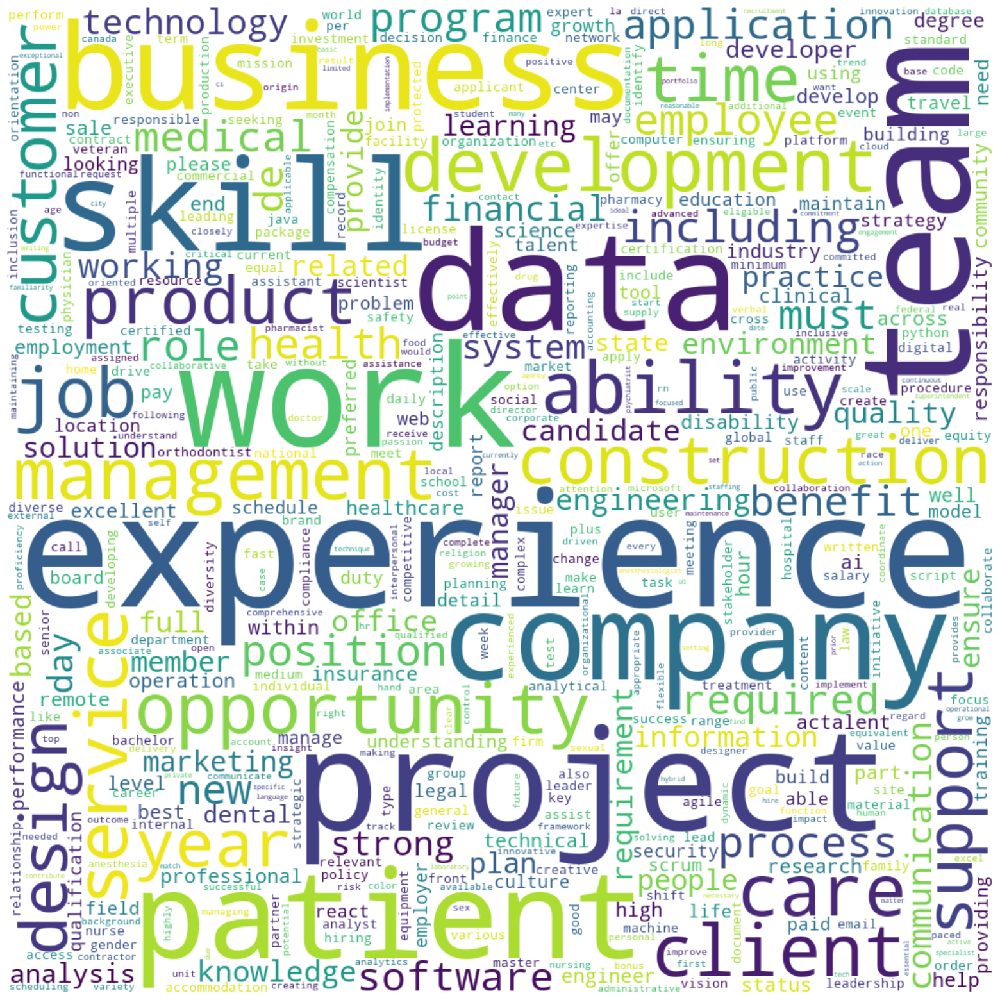

In [115]:
plt.figure(figsize = (20,20))

wordcloud = WordCloud(max_words = 500 , width = 1000 , height = 1000 , background_color="white").generate_from_frequencies(tfidf_word_freq)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Performing elbow method

In [107]:
wcss = []

for i in tqdm(range(1, 500, 20)):
    clustering = KMeans(n_clusters=i, init='k-means++', random_state=42)
    clustering.fit(tfidf_matrix)
    wcss.append(clustering.inertia_)

  0%|          | 0/25 [00:00<?, ?it/s]/usr/local/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

100%|██████████| 25/25 [57:03<00:00, 136.96s/it]


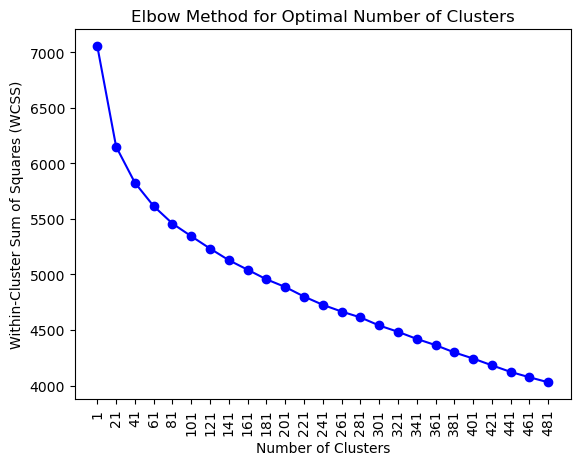

In [112]:
plt.plot(range(1, 500, 20), wcss, marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(range(1, 500, 20))
plt.xticks(rotation=90)
plt.show()

In [113]:
wcss = []

for i in tqdm(range(1, 2000, 100)):
    clustering = KMeans(n_clusters=i, init='k-means++', random_state=42)
    clustering.fit(tfidf_matrix)
    wcss.append(clustering.inertia_)

  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

100%|██████████| 20/20 [3:53:12<00:00, 699.64s/it]  


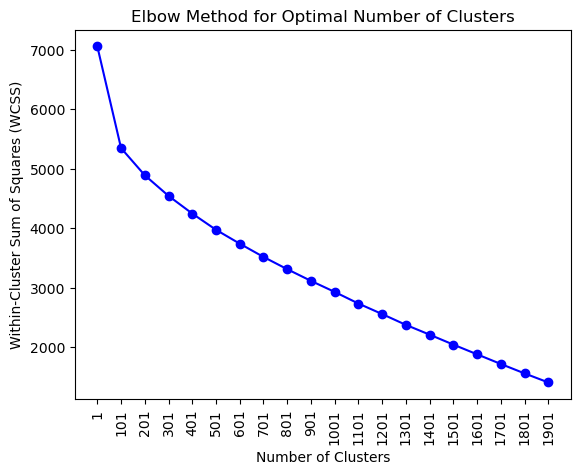

In [116]:
plt.plot(range(1, 2000, 100), wcss, marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(range(1, 2000, 100))
plt.xticks(rotation=90)
plt.show()

In [116]:
wcss_80 = []

for i in tqdm(range(1, 81)):
    clustering = KMeans(n_clusters=i, init='k-means++', random_state=42)
    clustering.fit(tfidf_matrix)
    wcss_80.append(clustering.inertia_)

  0%|          | 0/80 [00:00<?, ?it/s]/usr/local/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

100%|██████████| 80/80 [34:17<00:00, 25.71s/it]


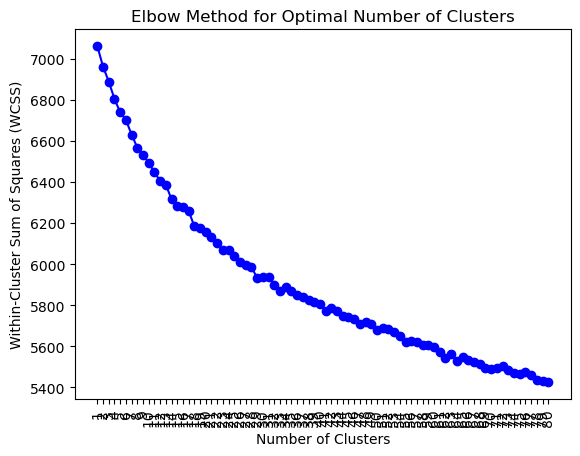

In [118]:
plt.plot(range(1, 81), wcss_80, marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(range(1, 81))
plt.xticks(rotation=90)
plt.show()

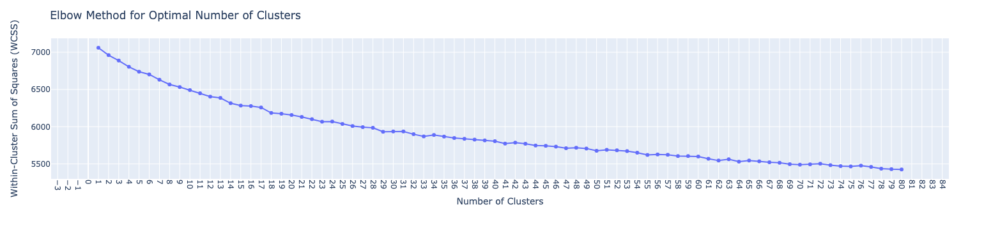

In [121]:
fig = px.line(x=range(1, 81), y=wcss_80, markers=True)

# Update the layout
fig.update_layout(title='Elbow Method for Optimal Number of Clusters',
                   xaxis_title='Number of Clusters',
                   yaxis_title='Within-Cluster Sum of Squares (WCSS)',
                   xaxis=dict(tickmode='linear', tickvals=list(range(1, 81)), tickangle=90),
                   yaxis=dict(showgrid=True, zeroline=False))

# Show the plot
fig.show()

## DBSCAN for clustering

In [87]:
dbscan = DBSCAN(eps=1.0, min_samples=5)
dbscan.fit(tfidf_matrix)

DBSCAN(eps=1.0)

In [88]:
cluster_labels = dbscan.labels_
coords = tfidf_matrix.toarray()

In [95]:
no_clusters = len(np.unique(cluster_labels) )
no_noise = np.sum(np.array(cluster_labels) == -1, axis=0)

print('Estimated no. of clusters: %d' % no_clusters)
print('Estimated no. of noise points: %d' % no_noise)

Estimated no. of clusters: 179
Estimated no. of noise points: 4731


In [100]:
dbscan_2 = DBSCAN(eps=1.0, min_samples=3)
dbscan_2.fit(tfidf_matrix)

DBSCAN(eps=1.0, min_samples=3)

In [101]:
cluster_labels = dbscan_2.labels_
coords = tfidf_matrix.toarray()

no_clusters = len(np.unique(cluster_labels) )
no_noise = np.sum(np.array(cluster_labels) == -1, axis=0)

print('Estimated no. of clusters: %d' % no_clusters)
print('Estimated no. of noise points: %d' % no_noise)

Estimated no. of clusters: 412
Estimated no. of noise points: 3856


# Generating 19 clusters using kmeans algorithm

In [191]:
best_kmeans = KMeans(n_clusters=19, init='k-means++', random_state=42)
best_kmeans.fit(tfidf_matrix)

/usr/local/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=19, random_state=42)

In [192]:
df['cluster'] = best_kmeans.labels_

In [193]:
df[df['cluster'] == 0][['job_title']].value_counts().reset_index()

,job_title,count
0,Orthodontist,166
1,Prosthodontist,28
2,General Dentist,4
3,Dentist,2
4,"General Dentist $50,000 Bonus Package",2
5,ORTHODONTIST,2
6,Orthodontist - Part-Time,2
7,Orthodontist - Private Office,2
8,Orthodontist in Private Office,2
9,"Orthodontist- Orchard Park, NY",2


In [194]:
df[df['cluster'] == 4][['job_title']].value_counts().reset_index()

,job_title,count
0,Anesthesia,36
1,"Adult Cardiac Anesthesia in Las Vegas, NV",6
2,"Anesthesiology Position in Las Vegas, NV",6
3,"Peds Cardiac Anesthesia in Las Vegas, NV",6
4,"General Anesthesia in Las Vegas, NV",4
5,"Pediatric Anesthesia in Las Vegas, NV",2


In [195]:
df[df['cluster'] == 16][['job_title']].value_counts().reset_index()

,job_title,count
0,Graphic Designer,18
1,Social Media Manager,8
2,Copywriter,7
3,Marketing Manager,7
4,Head of Marketing,7
...,...,...
140,Events & Marketing Manager,1
141,"Director, North America Marketing Planning",1
142,Motion Graphics Designer,1
143,Micro Influencer Position - Part Time,1


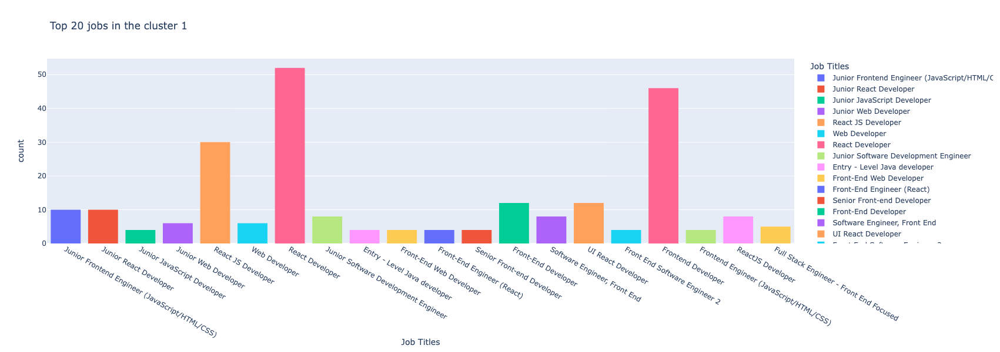

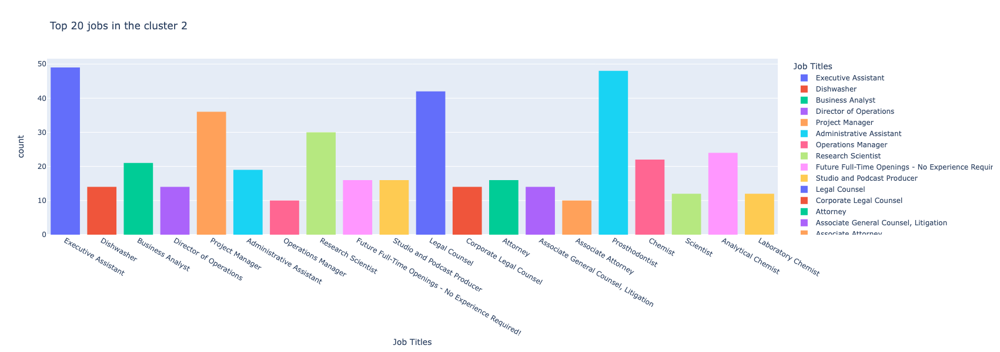

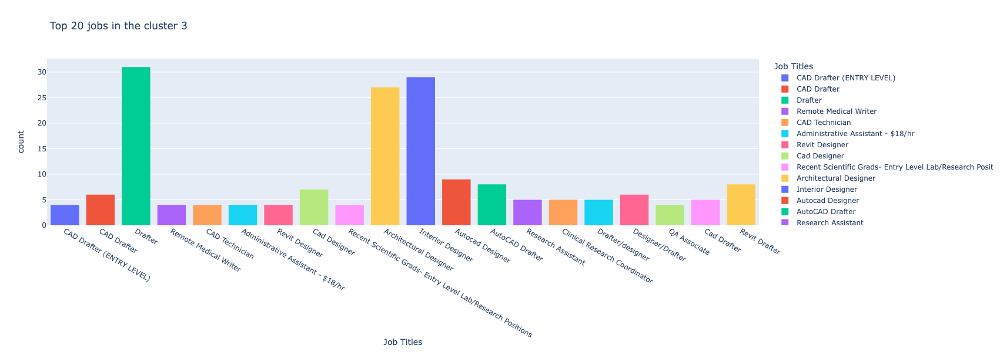

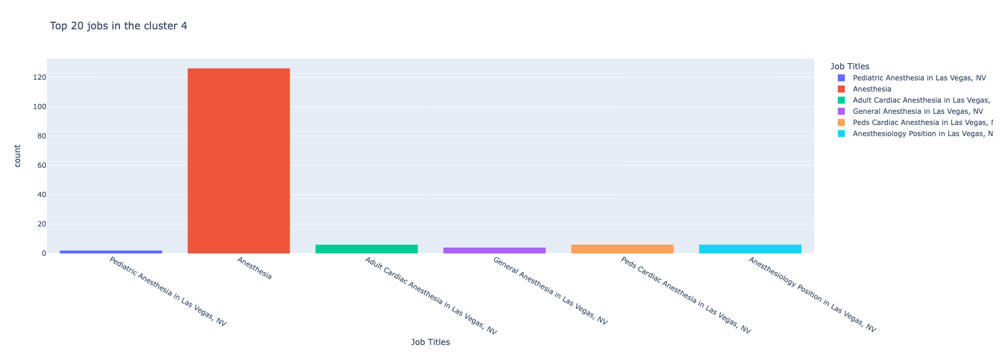

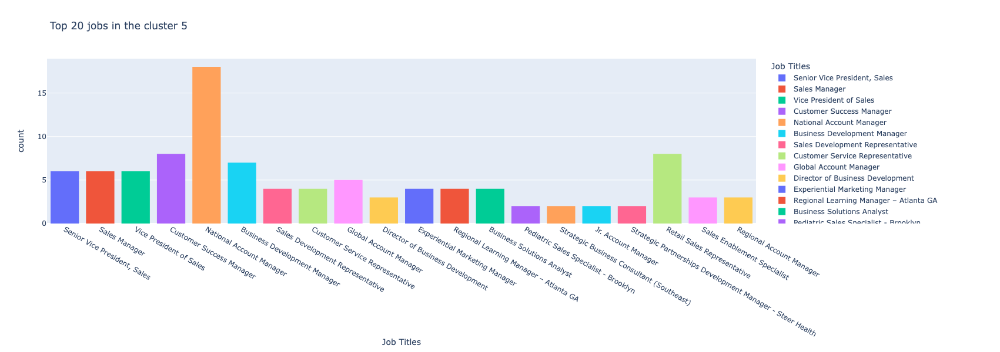

...

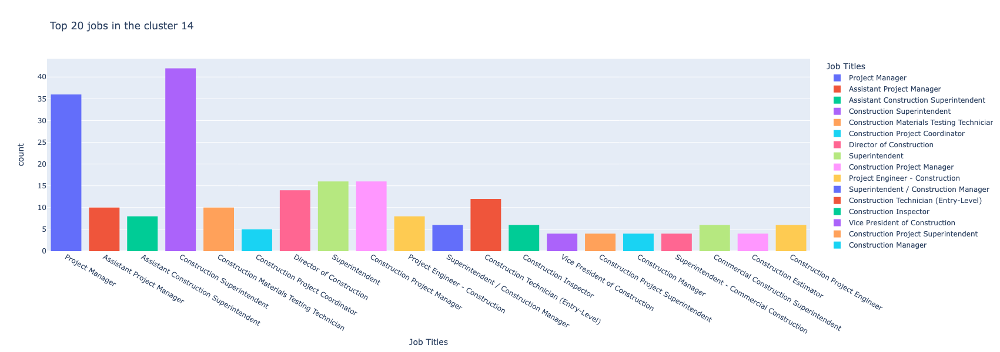

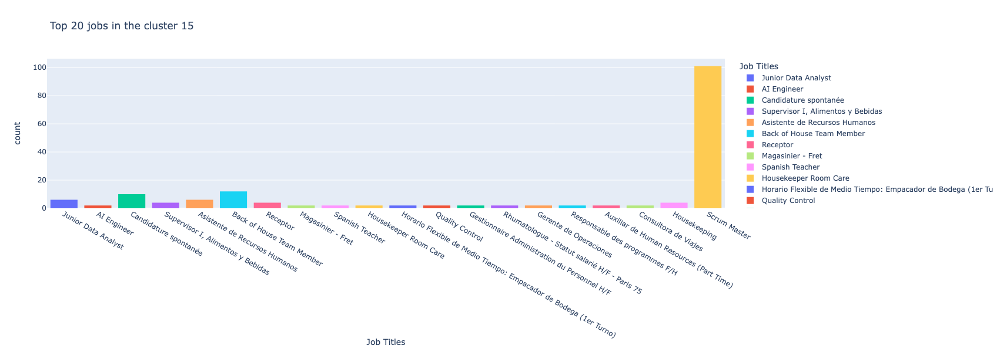

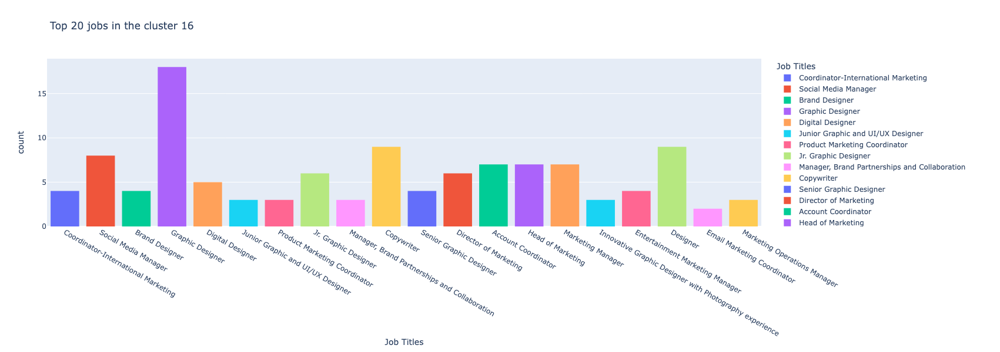

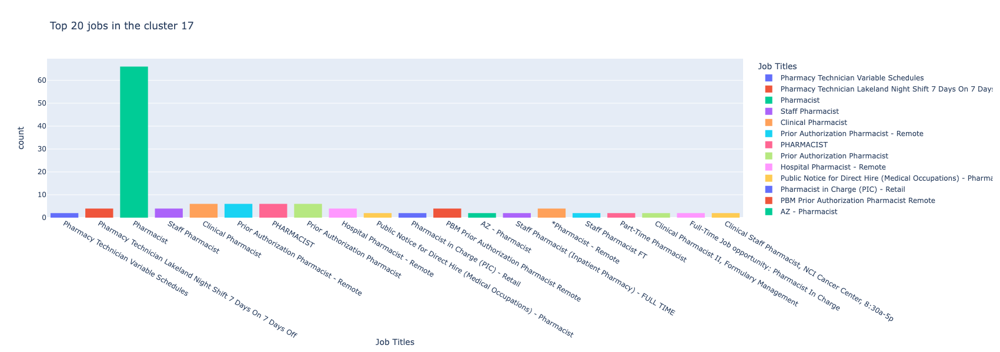

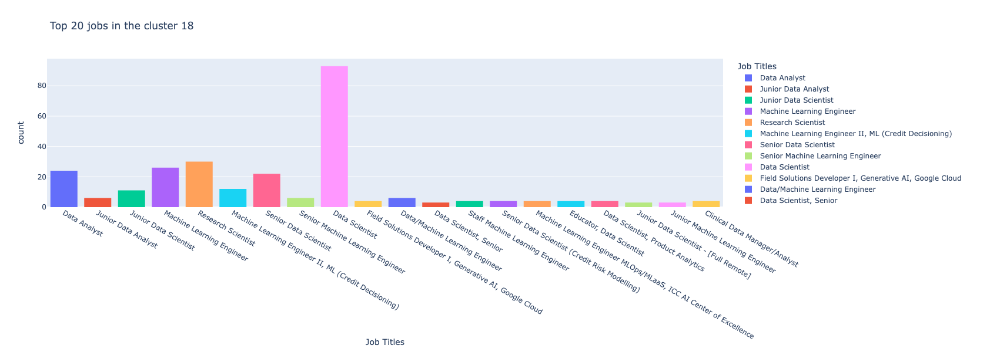

In [198]:
for c in range(1, 19):
    clustering = df[df['cluster'] == c]['job_title'].value_counts()[:20].index
    top_20_jobs_in_cluster = df[df['job_title'].isin(clustering)]
    fig = px.histogram(top_20_jobs_in_cluster, x='job_title', color='job_title', height=600, title=f'Top 20 jobs in the cluster {c}', 
                      labels={
                          'job_title': 'Job Titles',
                          'count': 'Number of jobs'
                      })
    fig.show()

### list top words from the clusters

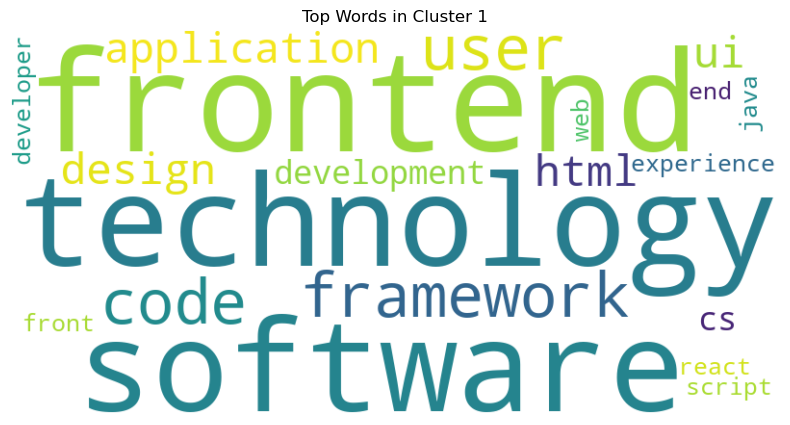

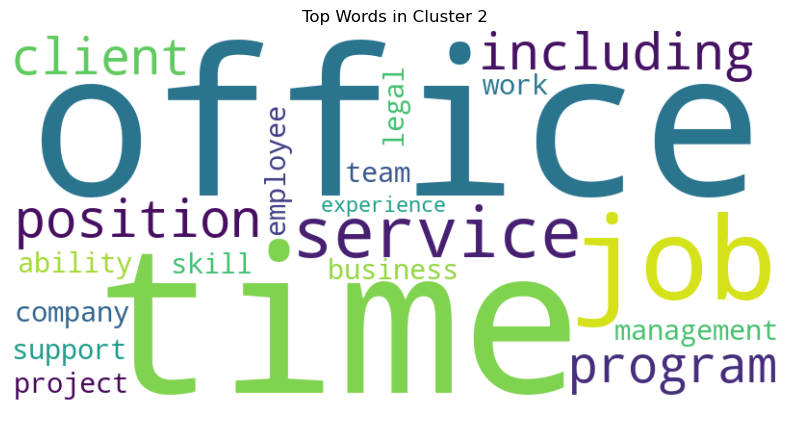

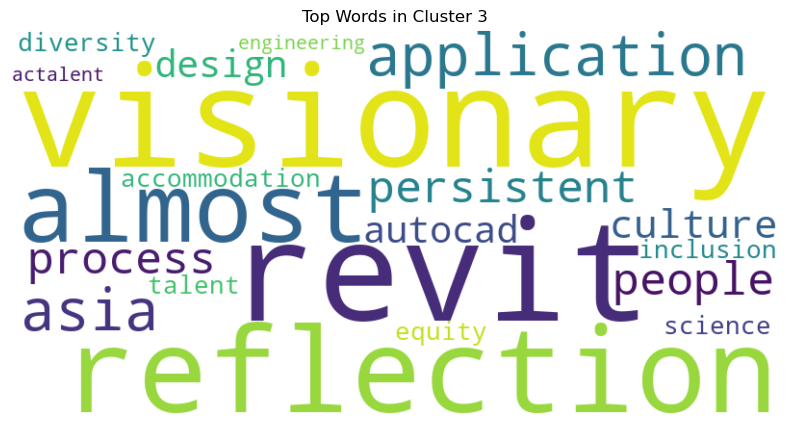

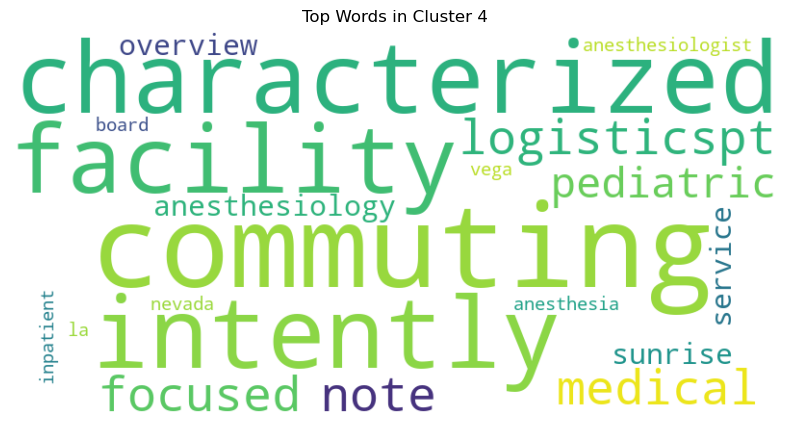

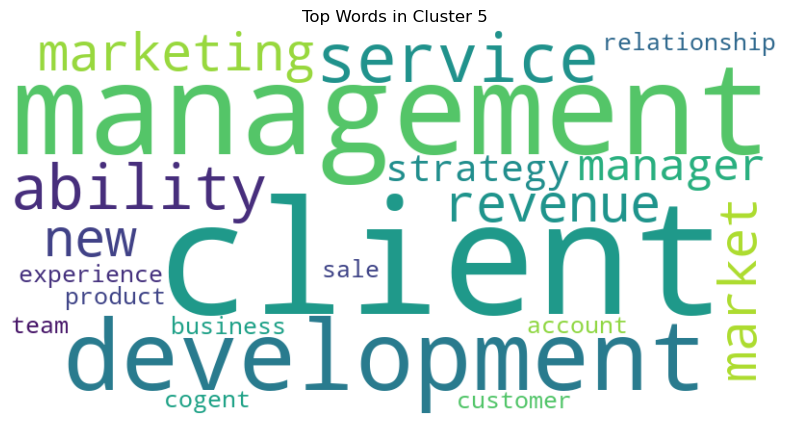

...

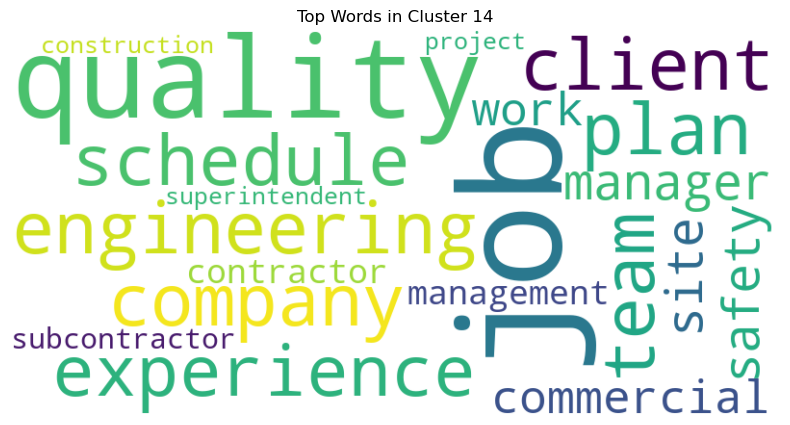

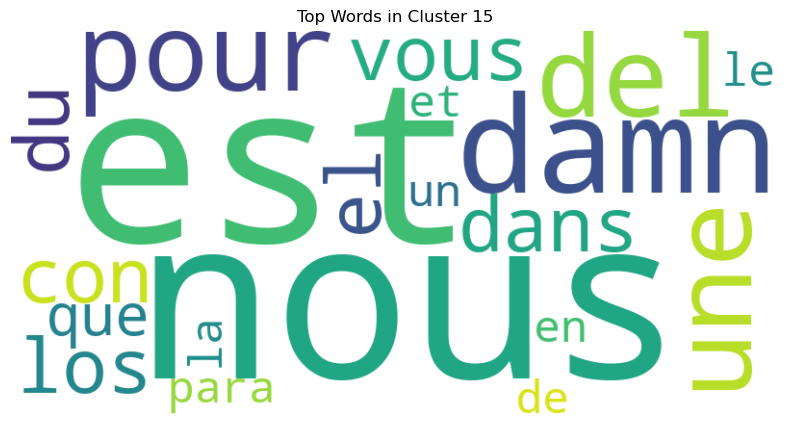

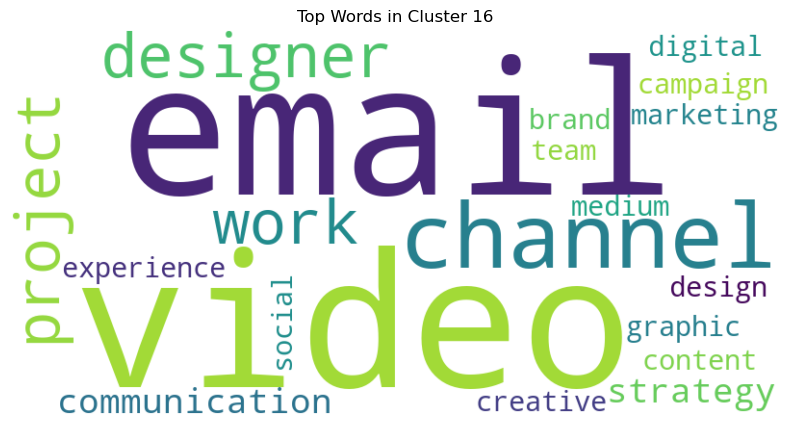

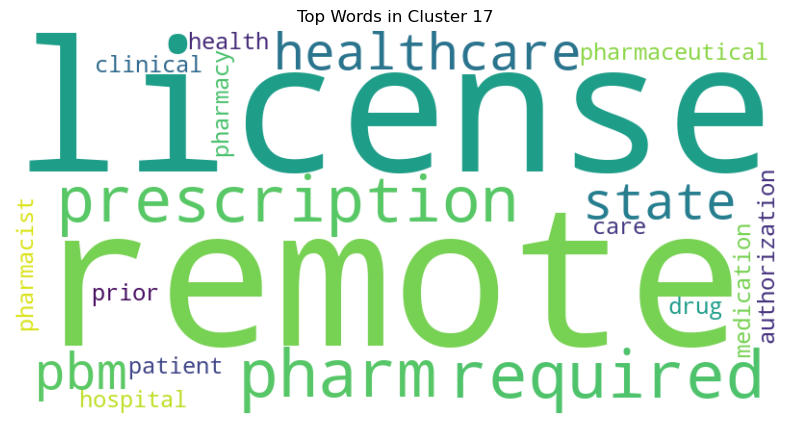

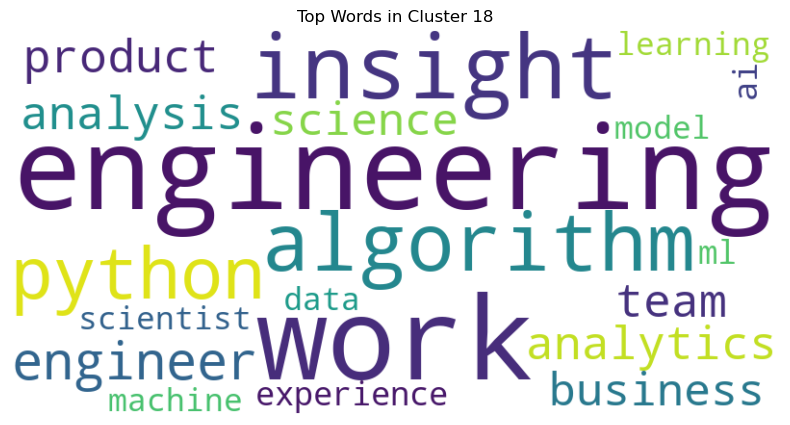

In [197]:
cluster_centers = best_kmeans.cluster_centers_
terms = tfidf_vectorizer.get_feature_names_out()
top_words_per_cluster = []
for cluster in range(1,19):
    top_words_idx = cluster_centers[cluster].argsort()[-20:]
    top_words = [terms[idx] for idx in top_words_idx]
    top_words_per_cluster.append(top_words)

for i, top_words in enumerate(top_words_per_cluster):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(top_words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Top Words in Cluster {i+1}')
    plt.axis('off')
    plt.show()
    wordcloud.to_file(f'{i+1}.png')